In [1]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.mpl.ticker as cticker
import cartopy.feature as cfeature

#### Load the data

In [2]:
#specify the data directory path
direc_data = 'C:/Users/ionph/MLdata/'
#direc_data = 

# Load the datasets
ds_gi = xr.open_dataset(f'{direc_data}GrayImagery_remapped.nc')
ds_co = xr.open_dataset(f'{direc_data}CloudOpticalDepth_remapped.nc')
ds_sw = xr.open_dataset(f'{direc_data}ReflectedSW_remapped.nc')

#### Data Visualization
Here we visualize our data of 3 variables across 10 days. 

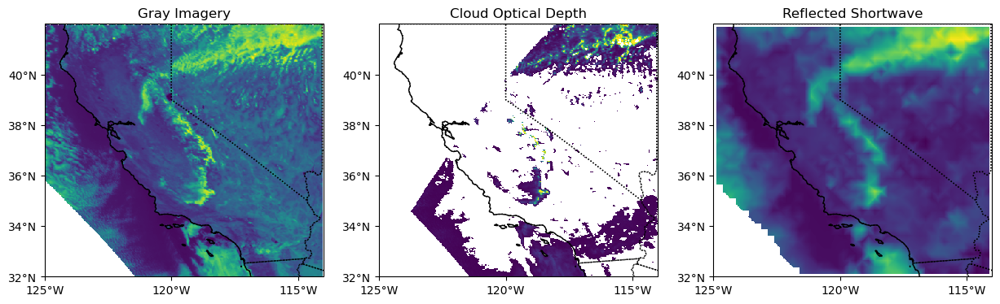

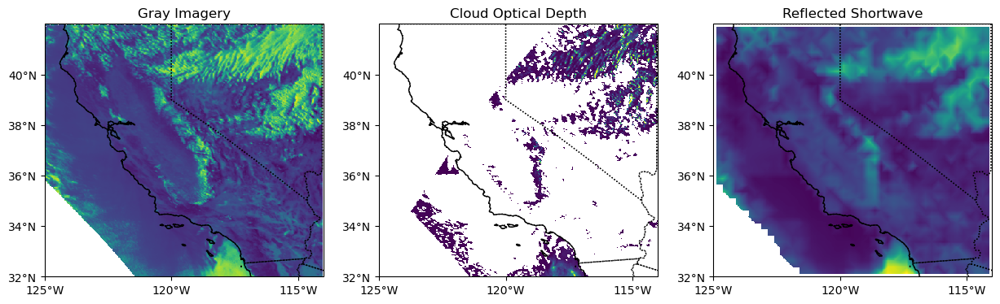

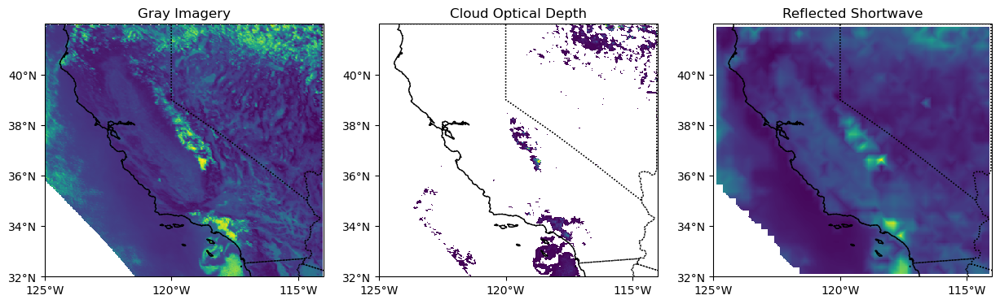

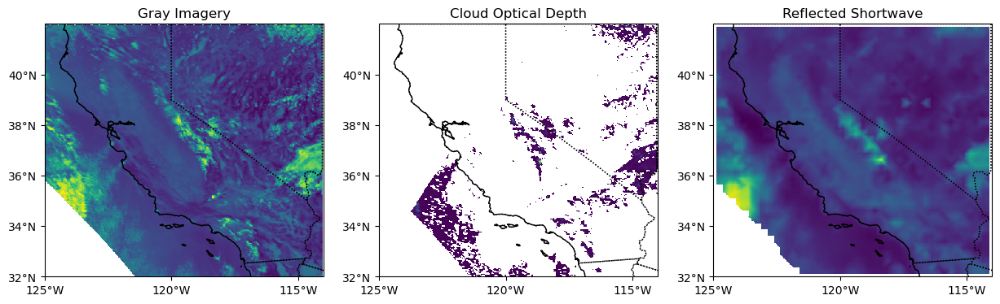

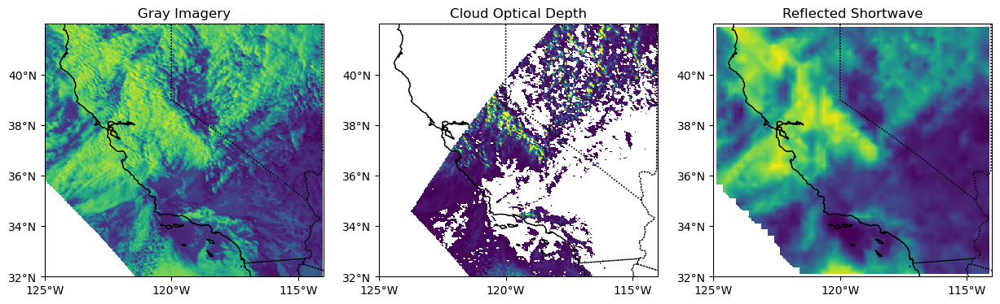

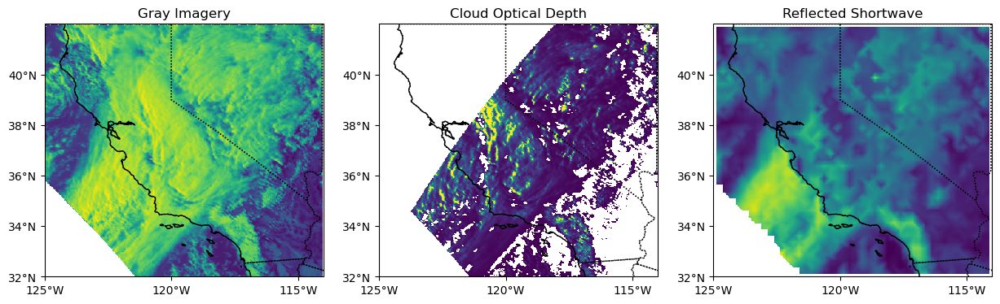

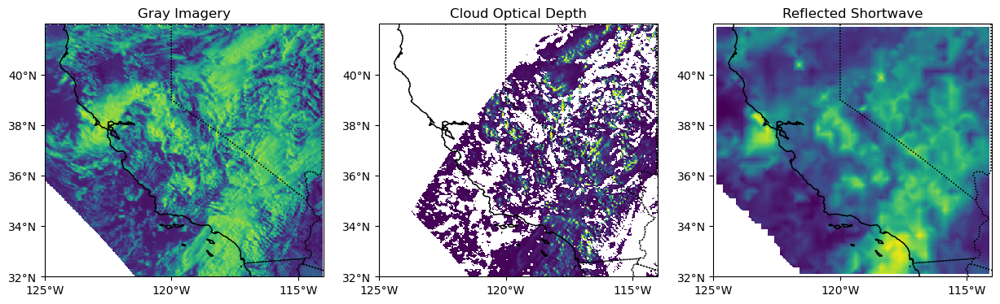

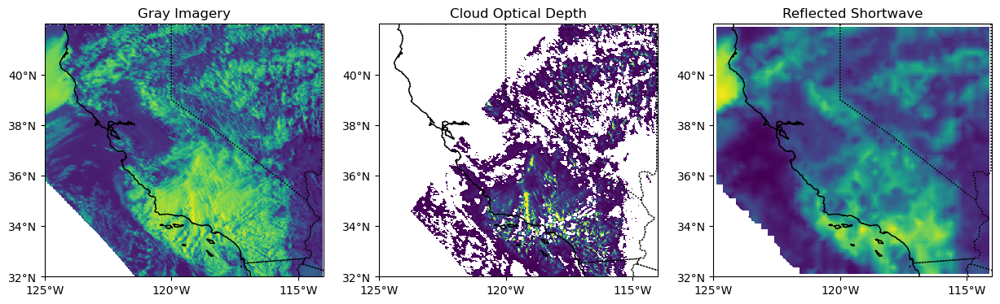

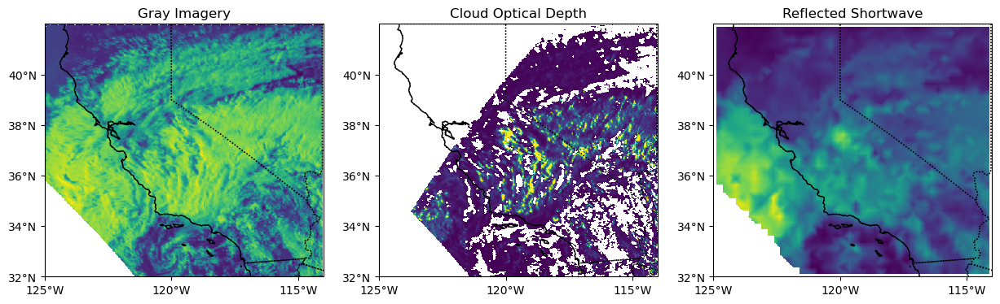

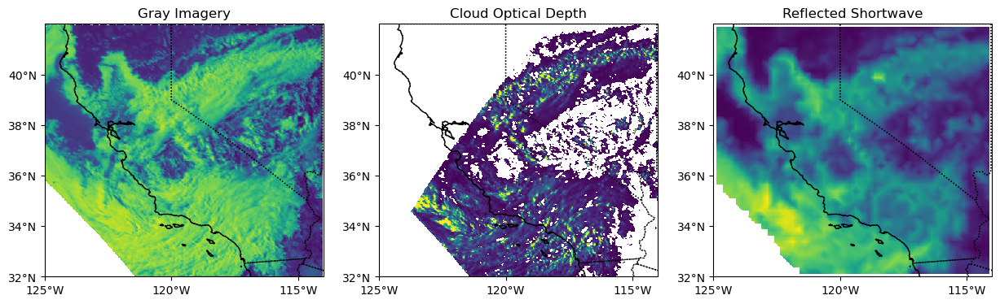

In [3]:
days = ds_gi.time.values
for day in range(len(days)):
    # Plot the Gray Imagery data, cloud optical depth data, and reflected shortwave data for the 8th day
    fig = plt.figure(figsize=(15, 10))
    axs = fig.add_subplot(1, 3, 1, projection=ccrs.PlateCarree())
    plt.pcolormesh(ds_gi.longitude,ds_gi.latitude, ds_gi['GrayImagery'][day],transform=ccrs.PlateCarree())
    axs.set_extent([-125, -114, 32, 42], ccrs.PlateCarree())
    # Define the xticks for longitude
    axs.set_xticks(np.arange(-125,-114,5), crs=ccrs.PlateCarree())
    lon_formatter = cticker.LongitudeFormatter()
    axs.xaxis.set_major_formatter(lon_formatter)

    # Define the yticks for latitude
    axs.set_yticks(np.arange(32,42,2), crs=ccrs.PlateCarree())
    lat_formatter = cticker.LatitudeFormatter()
    axs.yaxis.set_major_formatter(lat_formatter)
    axs.coastlines(resolution='10m')
    axs.add_feature(cfeature.BORDERS, linestyle=':')
    axs.add_feature(cfeature.STATES, linestyle=':')
    plt.title('Gray Imagery')

    axs = fig.add_subplot(1, 3, 2, projection=ccrs.PlateCarree())
    plt.pcolormesh(ds_co.longitude,ds_co.latitude, ds_co['CloudOpticalDepth'][day],transform=ccrs.PlateCarree())
    axs.set_extent([-125, -114, 32, 42], ccrs.PlateCarree())
    # Define the xticks for longitude
    axs.set_xticks(np.arange(-125,-114,5), crs=ccrs.PlateCarree())
    lon_formatter = cticker.LongitudeFormatter()
    axs.xaxis.set_major_formatter(lon_formatter)

    # Define the yticks for latitude
    axs.set_yticks(np.arange(32,42,2), crs=ccrs.PlateCarree())
    lat_formatter = cticker.LatitudeFormatter()
    axs.yaxis.set_major_formatter(lat_formatter)
    axs.coastlines(resolution='10m')
    axs.add_feature(cfeature.BORDERS, linestyle=':')
    axs.add_feature(cfeature.STATES, linestyle=':')
    plt.title('Cloud Optical Depth')

    axs = fig.add_subplot(1, 3, 3, projection=ccrs.PlateCarree())
    plt.pcolormesh(ds_sw.longitude,ds_sw.latitude, ds_sw['ReflectedSW'][day],transform=ccrs.PlateCarree())
    axs.set_extent([-125, -114, 32, 42], ccrs.PlateCarree())
    # Define the xticks for longitude
    axs.set_xticks(np.arange(-125,-114,5), crs=ccrs.PlateCarree())
    lon_formatter = cticker.LongitudeFormatter()
    axs.xaxis.set_major_formatter(lon_formatter)

    # Define the yticks for latitude
    axs.set_yticks(np.arange(32,42,2), crs=ccrs.PlateCarree())
    lat_formatter = cticker.LatitudeFormatter()
    axs.yaxis.set_major_formatter(lat_formatter)
    axs.coastlines(resolution='10m')
    axs.add_feature(cfeature.BORDERS, linestyle=':')
    axs.add_feature(cfeature.STATES, linestyle=':')
    plt.title('Reflected Shortwave')

    plt.show()

#### From here on out, this dataset will be converted into a pandas dataframe.
##### This will allow us to perform some basic data analysis on the dataset and make it easier for machine learning models to process the data. 

In [4]:
# Convert each xarray dataset to DataFrame
df_shortwave = ds_sw['ReflectedSW'].to_dataframe().reset_index()
df_brightness = ds_gi['GrayImagery'].to_dataframe().reset_index()
df_optdepth = ds_co['CloudOpticalDepth'].to_dataframe().reset_index()

# Merge DataFrames on time, latitude, and longitude
merged_df = pd.merge(df_shortwave, df_brightness, on=["time", "latitude", "longitude"], suffixes=('_sw', '_cod'))
merged_df = pd.merge(merged_df, df_optdepth, on=["time", "latitude", "longitude"])
# Check the final structure
print(merged_df.head())

# drop points with NaN values for all of the variables
merged_df = merged_df.dropna()
# Check the final structure
print(merged_df.head())

   time  latitude  longitude  ReflectedSW  GrayImagery  CloudOpticalDepth
0    91      32.0   -125.000          NaN          NaN                NaN
1    91      32.0   -124.975          NaN          NaN                NaN
2    91      32.0   -124.950          NaN          NaN                NaN
3    91      32.0   -124.925          NaN          NaN                NaN
4    91      32.0   -124.900          NaN          NaN                NaN
      time  latitude  longitude  ReflectedSW  GrayImagery  CloudOpticalDepth
2344    91    32.125   -121.525   194.303659     0.493587           4.140871
2345    91    32.125   -121.500   192.034164     0.398089           1.691777
2346    91    32.125   -121.475   189.764670     0.441833           2.605019
2347    91    32.125   -121.450   187.495175     0.475588           3.333172
2348    91    32.125   -121.425   185.225681     0.438950           2.474653


Only utilizing 1% of the data for training because of the massive size of the data set. Otherwise, training takes hours to days

In [5]:
from sklearn.model_selection import train_test_split

# Define features for analysis
features = merged_df[['ReflectedSW', 'GrayImagery', 'CloudOpticalDepth']]

# Initial split: 10% training, 90% testing
train_data, test_data = train_test_split(features, test_size=0.9, random_state=42)

# Further split the training data into 10% training and 90% validation (equivalent to 1% training, 9% validation)
train_data, val_data = train_test_split(train_data, test_size=0.9, random_state=42)

In [6]:
train_data

,ReflectedSW,GrayImagery,CloudOpticalDepth
1477445,346.522476,0.667439,9.492583
1253968,173.856392,0.388362,1.007153
1497827,262.039345,0.642974,8.681712
1573819,181.513940,0.564153,3.412858
965996,230.135486,0.707316,86.102833
...,...,...,...
1643369,376.918634,0.627223,9.139632
1173757,254.238954,0.582284,12.287694
1263140,93.211956,0.340265,0.852579
740568,131.706075,0.373717,0.942489


In [25]:
# Using the PyCaret package, test a variety of clustering algorithms to cluster the data points into 3 groups
from pycaret.clustering import *
clu = setup(data = train_data, normalize = True)

,Description,Value
0,Session id,6601
1,Original data shape,"(5488, 3)"
2,Transformed data shape,"(5488, 3)"
3,Numeric features,3
4,Preprocess,True
5,Imputation type,simple
6,Numeric imputation,mean
7,Categorical imputation,mode
8,Normalize,True
9,Normalize method,zscore


In [ ]:
# View all models available for clustering
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch


In [ ]:
# train all of the available clustering models
print('Training K-Means')
kmeans = create_model('kmeans')

print('Training Affinity Propagation')
ap = create_model('ap')

print('Training Mean Shift Clustering')
meanshift = create_model('meanshift')

print('Training Spectral Clustering')
sc = create_model('sc')

print('Training Agglomerative Clustering')
hclust = create_model('hclust')

print('Training DBSCAN')
dbscan = create_model('dbscan')

print('Training OPTICS')
optics = create_model('optics')

print('Training Birch')
birch = create_model('birch')

Training K-Means


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4005,5444.5573,0.8384,0,0,0


Training Affinity Propagation


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1618,512.0182,0.7936,0,0,0


Training Mean Shift Clustering


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5428,2597.0778,0.7780,0,0,0


Training Spectral Clustering


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5558,668.6958,1.1947,0,0,0


Training Agglomerative Clustering


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2999,4204.1165,0.8741,0,0,0


Training DBSCAN


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5030,49.5346,1.2930,0,0,0


Training OPTICS


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3971,15.6863,1.3651,0,0,0


Training Birch


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3327,2040.0529,0.9690,0,0,0


In [28]:
# Evaluate the performance of the K-Means clustering model
evaluate_model(kmeans)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [29]:
# Evaluate the performance of the Affinity Propogation model
evaluate_model(ap)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [37]:
# Evaluate the performance of the Mean Shift Clustering model
evaluate_model(meanshift)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [31]:
# Evaluate the performance of the Spectral Clustering model
evaluate_model(sc)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [36]:
# Evaluate the performance of the Agglomerative Clustering model
evaluate_model(hclust)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [33]:
# Evaluate the performance of the DBSCAN model
evaluate_model(dbscan)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [34]:
# Evaluate the performance of the OPTICS model
evaluate_model(optics)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [35]:
# Evaluate the performance of the Birch model
evaluate_model(birch)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

### Comparison of Models

From the above clustering plots, we can se that some models are better fits to our data than others. For example, Optics and Affinity Propagation both created hundreds of clusters to group the data, which is not realistic to the visual groups we can see on the plots.

While the remaining models did a far more realistic job splitting the data, 4 of the models seem to have done the best job grouping the data based on the visual groups. Those models are KMeans, Spectral Clustering, Agglomerative Clustering, and Birch Clustering. 

It is worth mentioning that training all of these models on our massive dataset was extremely computationally intensive, which is why I had to cut the data down to 1% of it's original size to make this notebook possible to run in a few minutes. Therefore, it will be crucial to perform an assessment of model training performance as we move forward with the project.